# **California Housing Price Prediction with Random Forest**
1.   Load the data
2.   Exploring & visualizing the data to gain insights
3.   Preparing the data for ml algorithm
4.   Training & Tuning the model
6.   Conclusion

In [1]:
# === Import libraries ===
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
from sklearn.model_selection import StratifiedShuffleSplit, train_test_split, cross_val_score, RandomizedSearchCV
from sklearn.compose import make_column_selector, make_column_transformer, ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder, FunctionTransformer
from sklearn.metrics import mean_squared_error, make_scorer
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics.pairwise import rbf_kernel 
from sklearn.impute import SimpleImputer
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from scipy.stats import randint
from sklearn import set_config
import scipy.stats as stats
from folium import Circle
from zlib import crc32
import seaborn as sns
import pandas as pd
import numpy as np
import folium

***Custom RMSE scorer***

"Scikit-learn doesn't natively support RMSE in some versions, so you need a custom scorer."

In [2]:
def root_mean_squared_error(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

# Convert to scorer (negative because scikit-learn tries to maximize score)
rmse_scorer = make_scorer(root_mean_squared_error, greater_is_better=False)

# 1. Load The Data

In [3]:
housing = pd.read_csv("/kaggle/input/california-housing-prices/housing.csv")

In [4]:
housing.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


In [5]:
housing["ocean_proximity"].value_counts()

ocean_proximity
<1H OCEAN     9136
INLAND        6551
NEAR OCEAN    2658
NEAR BAY      2290
ISLAND           5
Name: count, dtype: int64

In [6]:
housing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


In [7]:
housing.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,20640.000000,20640.000000,20640.000000,20640.000000,20433.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,-119.569704,35.631861,28.639486,2635.763081,537.870553,1425.476744,499.539680,3.870671,206855.816909
std,2.003532,2.135952,12.585558,2181.615252,421.385070,1132.462122,382.329753,1.899822,115395.615874
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.800000,33.930000,18.000000,1447.750000,296.000000,787.000000,280.000000,2.563400,119600.000000
50%,-118.490000,34.260000,29.000000,2127.000000,435.000000,1166.000000,409.000000,3.534800,179700.000000
75%,-118.010000,37.710000,37.000000,3148.000000,647.000000,1725.000000,605.000000,4.743250,264725.000000
max,-114.310000,41.950000,52.000000,39320.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


**Why Stratified Split?**

Since median_income is skewed, we bin it into categories for stratified sampling to ensure all income levels are proportionally represented.

In [8]:
# Create income categories (binning median_income)
housing["income_cat"] = pd.cut(housing["median_income"],
                               bins=[0., 1.5, 3.0, 4.5, 6., np.inf],
                               labels=[1, 2, 3, 4, 5])

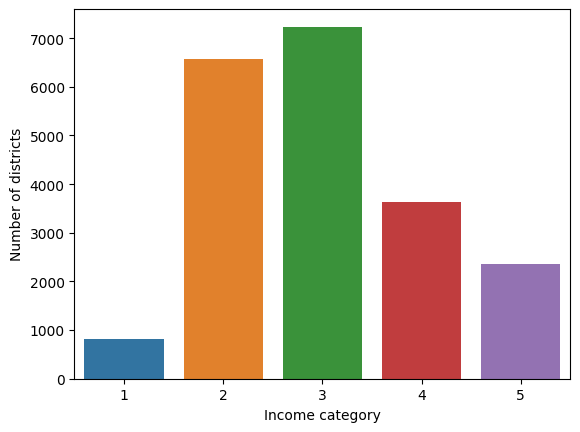

In [9]:
# Visualize the income category distributions
income_counts = housing["income_cat"].value_counts().sort_index()
sns.barplot(x=income_counts.index, y=income_counts.values,)
plt.xlabel("Income category")
plt.ylabel("Number of districts")
plt.show()

In [10]:
# We then use StratifiedShuffleSplit:
splitter = StratifiedShuffleSplit(n_splits=10, test_size=0.2, random_state=42)
strat_splits = []
for train_index, test_index in splitter.split(housing, housing["income_cat"]):
  strat_train_set_n = housing.iloc[train_index]
  strat_test_set_n = housing.iloc[test_index]
  strat_splits.append([strat_train_set_n, strat_test_set_n])

In [11]:
strat_train_set, strat_test_set = strat_splits[0]

In [12]:
strat_train_set, strat_test_set = train_test_split(
    housing, test_size=0.2, stratify=housing["income_cat"], random_state=42)

In [13]:
strat_test_set["income_cat"].value_counts() / len(strat_test_set)

income_cat
3    0.350533
2    0.318798
4    0.176357
5    0.114341
1    0.039971
Name: count, dtype: float64

In [14]:
for set_ in (strat_train_set, strat_test_set):
    set_.drop("income_cat", axis=1, inplace=True)

# 2. Exploring & visualizing the data to gain insights

In [15]:
housing = strat_train_set.copy()

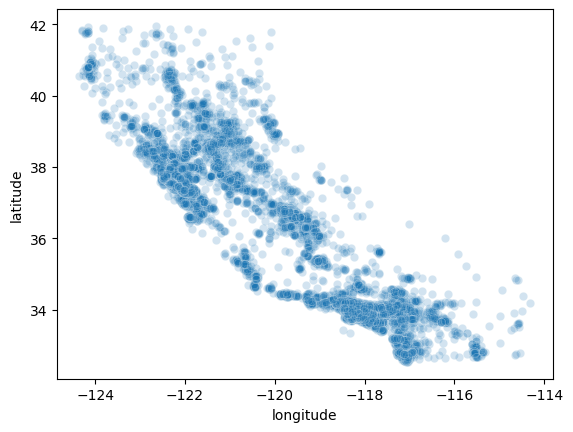

In [16]:
# Housing location:
sns.scatterplot(x=housing["longitude"], y=housing["latitude"], alpha=0.2)
plt.show()

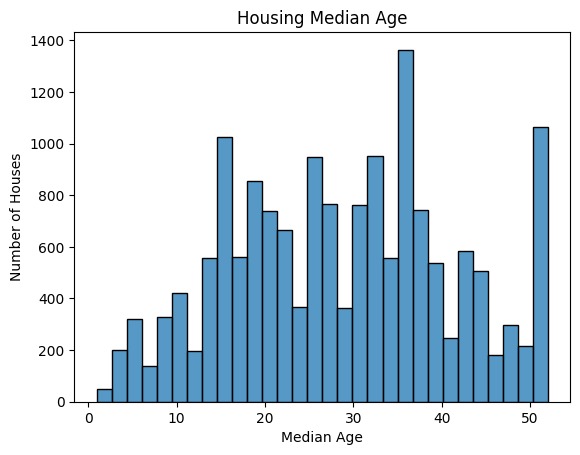

In [17]:
# Distribution of housing age:
sns.histplot(housing["housing_median_age"], bins=30, kde=False)
plt.title("Housing Median Age")
plt.xlabel("Median Age")
plt.ylabel("Number of Houses")
plt.show()

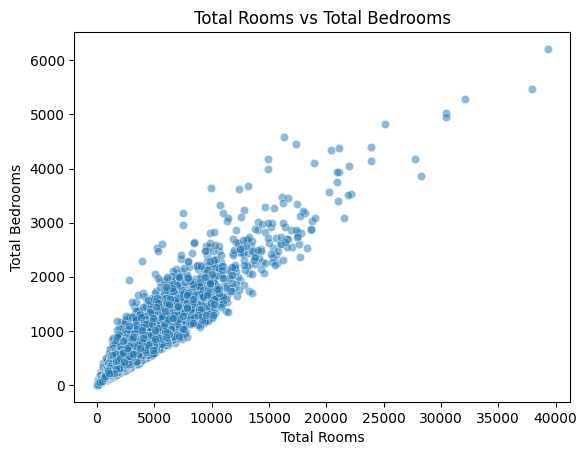

In [18]:
# Room vs. Bedroom correlation:
sns.scatterplot(x=housing['total_rooms'], y=housing['total_bedrooms'], alpha=0.5)
plt.title('Total Rooms vs Total Bedrooms')
plt.xlabel('Total Rooms')
plt.ylabel('Total Bedrooms')
plt.show()

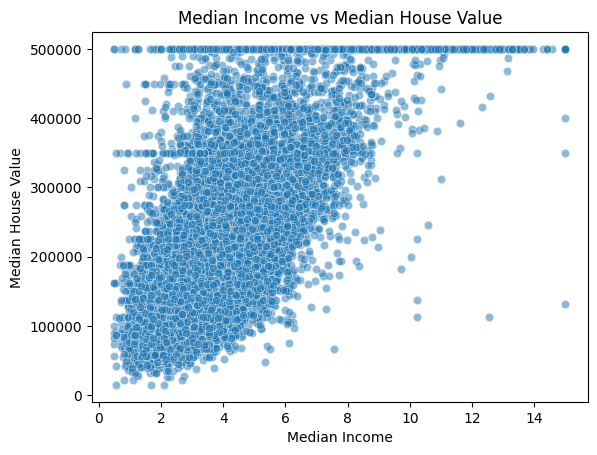

In [19]:
# Income vs. house value:
sns.scatterplot(x=strat_train_set['median_income'], y=strat_train_set['median_house_value'], alpha=0.5)
plt.title('Median Income vs Median House Value')
plt.xlabel('Median Income')
plt.ylabel('Median House Value')
plt.show()

In [20]:
# Correlation Matrix
corr_matrix = strat_train_set.corr(numeric_only=True)
corr_matrix["median_house_value"].sort_values(ascending=False)

median_house_value    1.000000
median_income         0.687151
total_rooms           0.135140
housing_median_age    0.114146
households            0.064590
total_bedrooms        0.047781
population           -0.026882
longitude            -0.047466
latitude             -0.142673
Name: median_house_value, dtype: float64

In [21]:
# Attribute Engineering
housing["rooms_per_house"] = housing["total_rooms"] / housing["households"]
housing["bedrooms_ratio"] = housing["total_bedrooms"] / housing["total_rooms"]
housing["people_per_house"] = housing["population"] / housing["households"]

# 3. Preparing the data for ML algorithm

In [22]:
# Separate features and labels
housing = strat_train_set.drop("median_house_value", axis = 1)
housing_labels = strat_train_set["median_house_value"].copy()

In [23]:
housing

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity
12655,-121.46,38.52,29.0,3873.0,797.0,2237.0,706.0,2.1736,INLAND
15502,-117.23,33.09,7.0,5320.0,855.0,2015.0,768.0,6.3373,NEAR OCEAN
2908,-119.04,35.37,44.0,1618.0,310.0,667.0,300.0,2.8750,INLAND
14053,-117.13,32.75,24.0,1877.0,519.0,898.0,483.0,2.2264,NEAR OCEAN
20496,-118.70,34.28,27.0,3536.0,646.0,1837.0,580.0,4.4964,<1H OCEAN
...,...,...,...,...,...,...,...,...,...
15174,-117.07,33.03,14.0,6665.0,1231.0,2026.0,1001.0,5.0900,<1H OCEAN
12661,-121.42,38.51,15.0,7901.0,1422.0,4769.0,1418.0,2.8139,INLAND
19263,-122.72,38.44,48.0,707.0,166.0,458.0,172.0,3.1797,<1H OCEAN
19140,-122.70,38.31,14.0,3155.0,580.0,1208.0,501.0,4.1964,<1H OCEAN


In [24]:
housing_labels

12655     72100.0
15502    279600.0
2908      82700.0
14053    112500.0
20496    238300.0
           ...   
15174    268500.0
12661     90400.0
19263    140400.0
19140    258100.0
19773     62700.0
Name: median_house_value, Length: 16512, dtype: float64

**Custom transformation**

Why Cluster Similarity?

Raw coordinates aren't informative.
We use KMeans + RBF kernel to convert geo-locations into similarity scores, capturing how close a house is to key location clusters.
This helps the model learn location-based pricing trends more effectively.

In [25]:
class ClusterSimilarity(BaseEstimator, TransformerMixin):
    def __init__(self, n_clusters=10, gamma=1.0, random_state=None):
        self.n_clusters = n_clusters
        self.gamma = gamma
        self.random_state = random_state

    def fit(self, X, y=None, sample_weight=None):
        self.kmeans_ = KMeans(self.n_clusters, n_init=10,
                              random_state=self.random_state)
        self.kmeans_.fit(X, sample_weight=sample_weight)
        return self

    def transform(self, X):
        return rbf_kernel(X, self.kmeans_.cluster_centers_, gamma=self.gamma)

    def get_feature_names_out(self, names=None):
        return [f"Cluster {i} similarity" for i in range(self.n_clusters)]

In [26]:
cluster_simil = ClusterSimilarity(n_clusters=10, gamma=1., random_state=42)
similarities = cluster_simil.fit_transform(housing[["latitude", "longitude"]],
                                           sample_weight=housing_labels)

In [27]:
similarities[:3].round(2)

array([[0.  , 0.49, 0.31, 0.  , 0.  , 0.  , 0.  , 0.85, 0.  , 0.16],
       [0.4 , 0.  , 0.  , 0.  , 0.  , 0.95, 0.11, 0.  , 0.  , 0.  ],
       [0.02, 0.  , 0.  , 0.15, 0.  , 0.  , 0.12, 0.  , 0.37, 0.  ]])

In [28]:
# Select features for clustering
X_cluster = housing[["median_income", "housing_median_age", "total_rooms", "population", "households",]]

# Apply your transformer
cluster_sim = ClusterSimilarity(n_clusters=10, gamma=1.0, random_state=42)
similarities = cluster_sim.fit_transform(X_cluster)

# wrap it into a DataFrame
sim_df = pd.DataFrame(similarities, columns=cluster_sim.get_feature_names_out())
sim_df["lat"] = housing["latitude"]
sim_df["lon"] = housing["longitude"]

# Let's take max similarity across clusters to visualize strongest affiliation
sim_df["max_similarity"] = sim_df[cluster_sim.get_feature_names_out()].max(axis=1)

# ----> Drop rows with NaN values in 'lat' or 'lon' <----
sim_df = sim_df.dropna(subset=['lat', 'lon',]) 

# Center map around the mean lat/lon
m = folium.Map(location=[sim_df["lat"].mean(), sim_df["lon"].mean()], zoom_start=10)

# Add points
for _, row in sim_df.iterrows():
    Circle(
        location=[row["lat"], row["lon"]],
        radius=50,
        color="blue",
        fill=True,
        fill_opacity=row["max_similarity"],  # Opacity shows similarity strength
    ).add_to(m)

# Display map
m

**Numerical and Categorical Pipelines**

In [29]:
num_pipeline = make_pipeline(SimpleImputer(strategy="median"), StandardScaler())

In [30]:
set_config(display='diagram')
num_pipeline

Pipeline(steps=[('simpleimputer', SimpleImputer(strategy='median')),
                ('standardscaler', StandardScaler())])

In [31]:
housing_num = housing.select_dtypes(include=[np.number])
housing_num_prepared = num_pipeline.fit_transform(housing_num)
housing_num_prepared[:2].round(2)

array([[-0.94,  1.35,  0.03,  0.58,  0.64,  0.73,  0.56, -0.89],
       [ 1.17, -1.19, -1.72,  1.26,  0.78,  0.53,  0.72,  1.29]])

In [32]:
df_housing_num_prepared = pd.DataFrame(
    housing_num_prepared, columns=num_pipeline.get_feature_names_out(),
    index=housing_num.index) 

In [33]:
df_housing_num_prepared.head(2)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income
12655,-0.941350,1.347438,0.027564,0.584777,0.640371,0.732602,0.556286,-0.893647
15502,1.171782,-1.192440,-1.722018,1.261467,0.781561,0.533612,0.721318,1.292168


In [34]:
num_attribs = ["longitude", "latitude", "housing_median_age", "total_rooms","age_simil_35",
               "total_bedrooms", "population", "households", "median_income"]
cat_attribs = ["ocean_proximity"]

cat_pipeline = make_pipeline(
    SimpleImputer(strategy="most_frequent"),
    OneHotEncoder(handle_unknown="ignore"))

preprocessing = make_column_transformer(
    (num_pipeline, make_column_selector(dtype_include=np.number)),
    (cat_pipeline, make_column_selector(dtype_include=object)),
)

In [35]:
housing_prepared = preprocessing.fit_transform(housing)

In [36]:
housing_prepared_df = pd.DataFrame(
    housing_prepared,
    columns=preprocessing.get_feature_names_out(),
    index=housing.index)
housing_prepared_df.head(2)

,pipeline-1__longitude,pipeline-1__latitude,pipeline-1__housing_median_age,pipeline-1__total_rooms,pipeline-1__total_bedrooms,pipeline-1__population,pipeline-1__households,pipeline-1__median_income,pipeline-2__ocean_proximity_<1H OCEAN,pipeline-2__ocean_proximity_INLAND,pipeline-2__ocean_proximity_ISLAND,pipeline-2__ocean_proximity_NEAR BAY,pipeline-2__ocean_proximity_NEAR OCEAN
12655,-0.941350,1.347438,0.027564,0.584777,0.640371,0.732602,0.556286,-0.893647,0.0,1.0,0.0,0.0,0.0
15502,1.171782,-1.192440,-1.722018,1.261467,0.781561,0.533612,0.721318,1.292168,0.0,0.0,0.0,0.0,1.0


**Combined Preprocessing**

1. Custom ratios – e.g., bedrooms/rooms, rooms/households

2. Log transforms – to handle skewed distributions

3. Cluster similarities – geo-based features using KMeans + RBF

4. ColumnTransformer – merges all steps into one clean pipeline

In [37]:
def column_ratio(X):
    return X[:, [0]] / X[:, [1]]

def ratio_name(_, feature_names_in):
    return ["ratio"] 

def ratio_pipeline():
    return make_pipeline(
        SimpleImputer(strategy="median"),
        FunctionTransformer(column_ratio, feature_names_out=ratio_name),
        StandardScaler())
    
log_pipeline = make_pipeline(
    SimpleImputer(strategy="median"),
    FunctionTransformer(np.log, feature_names_out="one-to-one"),
    StandardScaler())
default_num_pipeline = make_pipeline(SimpleImputer(strategy="median"),
                                     StandardScaler())

preprocessing = ColumnTransformer([
        ("bedrooms", ratio_pipeline(), ["total_bedrooms", "total_rooms"]),
        ("rooms_per_house", ratio_pipeline(), ["total_rooms", "households"]),
        ("people_per_house", ratio_pipeline(), ["population", "households"]),
        ("log", log_pipeline, ["total_bedrooms", "total_rooms", "population",
                               "households", "median_income"]),
        ("geo", cluster_simil, ["latitude", "longitude"]),
        ("cat", cat_pipeline, make_column_selector(dtype_include=object)),
    ],
    remainder=default_num_pipeline)

In [38]:
housing_prepared = preprocessing.fit_transform(housing)
housing_prepared.shape

(16512, 24)

In [39]:
preprocessing.get_feature_names_out()

array(['bedrooms__ratio', 'rooms_per_house__ratio',
       'people_per_house__ratio', 'log__total_bedrooms',
       'log__total_rooms', 'log__population', 'log__households',
       'log__median_income', 'geo__Cluster 0 similarity',
       'geo__Cluster 1 similarity', 'geo__Cluster 2 similarity',
       'geo__Cluster 3 similarity', 'geo__Cluster 4 similarity',
       'geo__Cluster 5 similarity', 'geo__Cluster 6 similarity',
       'geo__Cluster 7 similarity', 'geo__Cluster 8 similarity',
       'geo__Cluster 9 similarity', 'cat__ocean_proximity_<1H OCEAN',
       'cat__ocean_proximity_INLAND', 'cat__ocean_proximity_ISLAND',
       'cat__ocean_proximity_NEAR BAY', 'cat__ocean_proximity_NEAR OCEAN',
       'remainder__housing_median_age'], dtype=object)

In [40]:
housing_prepared_df = pd.DataFrame(
    housing_prepared,
    columns=preprocessing.get_feature_names_out(),
    index=housing.index
)

In [41]:
housing_prepared_df

,bedrooms__ratio,rooms_per_house__ratio,people_per_house__ratio,log__total_bedrooms,log__total_rooms,log__population,log__households,log__median_income,geo__Cluster 0 similarity,geo__Cluster 1 similarity,...,geo__Cluster 6 similarity,geo__Cluster 7 similarity,geo__Cluster 8 similarity,geo__Cluster 9 similarity,cat__ocean_proximity_<1H OCEAN,cat__ocean_proximity_INLAND,cat__ocean_proximity_ISLAND,cat__ocean_proximity_NEAR BAY,cat__ocean_proximity_NEAR OCEAN,remainder__housing_median_age
12655,-0.121122,0.017395,0.006223,0.873403,0.852032,0.938249,0.797843,-0.998832,3.391002e-16,4.706064e-01,...,1.070616e-13,8.217042e-01,1.493399e-07,1.579689e-01,0.0,1.0,0.0,0.0,0.0,0.027564
15502,-0.810867,0.569256,-0.040811,0.970407,1.277433,0.796538,0.913214,1.277742,4.197435e-01,1.850749e-16,...,1.233912e-01,1.272655e-22,6.521017e-05,7.678546e-18,0.0,0.0,0.0,0.0,1.0,-1.722018
2908,-0.338273,-0.018024,-0.075371,-0.430559,-0.317644,-0.702499,-0.375177,-0.403837,1.810043e-02,6.391756e-05,...,1.041204e-01,2.191546e-08,5.466398e-01,6.801739e-06,0.0,1.0,0.0,0.0,0.0,1.220460
14053,0.961205,-0.595140,-0.106803,0.281063,-0.118663,-0.299288,0.277558,-0.947769,1.937594e-01,3.147969e-18,...,4.545497e-02,9.457060e-25,9.793789e-06,1.564997e-19,0.0,0.0,0.0,0.0,1.0,-0.370069
20496,-0.474513,0.251241,0.006109,0.583337,0.730040,0.671139,0.528397,0.547635,2.991692e-01,2.354275e-08,...,8.143973e-01,5.612523e-13,2.281453e-01,4.312614e-09,1.0,0.0,0.0,0.0,0.0,-0.131489
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15174,-0.443846,0.466353,-0.092580,1.473719,1.579483,0.803919,1.276380,0.811447,3.213731e-01,3.071443e-17,...,7.563943e-02,1.680733e-23,2.291349e-05,1.005121e-18,1.0,0.0,0.0,0.0,0.0,-1.165333
12661,-0.516065,0.050362,0.023024,1.672897,1.807457,1.964650,1.753694,-0.449539,5.028941e-16,4.950336e-01,...,1.504055e-13,8.256769e-01,1.842162e-07,1.557476e-01,0.0,1.0,0.0,0.0,0.0,-1.085806
19263,0.322869,-0.509240,-0.037436,-1.293050,-1.427119,-1.212202,-1.137635,-0.189525,1.008715e-20,3.273126e-02,...,1.565906e-17,9.877901e-02,6.409134e-10,1.298829e-01,1.0,0.0,0.0,0.0,0.0,1.538566
19140,-0.457023,0.328149,-0.059156,0.434515,0.577261,0.102799,0.327708,0.400730,3.936388e-20,4.081377e-02,...,5.738335e-17,9.069403e-02,1.753811e-09,1.796418e-01,1.0,0.0,0.0,0.0,0.0,-1.165333


# 5. Training & Tuning The Model

In [42]:
# Training Random Forest 
forest_reg = make_pipeline(preprocessing, RandomForestRegressor(random_state=42))
forest_reg.fit(housing, housing_labels)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder=Pipeline(steps=[('simpleimputer',
                                                              SimpleImputer(strategy='median')),
                                                             ('standardscaler',
                                                              StandardScaler())]),
                                   transformers=[('bedrooms',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('functiontransformer',
                                                                   FunctionTransformer(feature_names_out=<function ratio_name at 0x791...
                                                  ClusterSimilarity(random_state=42),
                                                  ['latitude', 'longitude']),
                                                 ('cat',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehotencoder',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x7917bed5ae10>)])),
                ('randomforestregressor',
                 RandomForestRegressor(random_state=42))])

In [43]:
forest_predictions = forest_reg.predict(housing)
forest_rmse = root_mean_squared_error(housing_labels, forest_predictions)
forest_rmse

17606.6515564859

In [44]:
# Cross-Validation
cv_forest_rmses = -cross_val_score(forest_reg, housing, housing_labels, scoring=rmse_scorer, cv=10)
pd.Series(cv_forest_rmses).describe()

count       10.000000
mean     47328.317269
std       2527.589595
min      43625.026527
25%      45224.777860
50%      47291.793601
75%      49073.526315
max      51265.623767
dtype: float64

In [45]:
full_pipeline = Pipeline([
    ("preprocessing", preprocessing),
    ("random_forest", RandomForestRegressor(random_state=42)),
])

# Hyperparameter Tuning (RandomizedSearchCV)
param_distribs = {
    'preprocessing__geo__n_clusters': randint(3, 50),
    'random_forest__n_estimators': randint(50, 150),       # Number of trees
    'random_forest__max_features': randint(2, 20),         # Max features per split
    'random_forest__max_depth': randint(5, 30),            # Depth of each tree
    'random_forest__min_samples_split': randint(2, 10),    # Min samples to split a node
    'random_forest__min_samples_leaf': randint(1, 10),     # Min samples in a leaf node
}

rnd_search = RandomizedSearchCV(
    full_pipeline,
    param_distributions=param_distribs,
    n_iter=30,
    cv=5,
    scoring='neg_root_mean_squared_error',
    random_state=42,
    n_jobs=-1
)

rnd_search.fit(housing, housing_labels)

RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('preprocessing',
                                              ColumnTransformer(remainder=Pipeline(steps=[('simpleimputer',
                                                                                           SimpleImputer(strategy='median')),
                                                                                          ('standardscaler',
                                                                                           StandardScaler())]),
                                                                transformers=[('bedrooms',
                                                                               Pipeline(steps=[('simpleimputer',
                                                                                                SimpleImputer(strategy='median')),
                                                                                               ('functiontransformer',
                                                                                                FunctionTransformer(feature_names_...
                                        'random_forest__min_samples_leaf': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7917ddcc91d0>,
                                        'random_forest__min_samples_split': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7917bed3fcd0>,
                                        'random_forest__n_estimators': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7917bf0da190>},
                   random_state=42, scoring='neg_root_mean_squared_error')

In [46]:
print("Best Hyperparameters:", rnd_search.best_params_)

Best Hyperparameters: {'preprocessing__geo__n_clusters': 35, 'random_forest__max_depth': 20, 'random_forest__max_features': 6, 'random_forest__min_samples_leaf': 3, 'random_forest__min_samples_split': 5, 'random_forest__n_estimators': 135}


In [47]:
print("Best RMSE Score:", -rnd_search.best_score_)

Best RMSE Score: 42727.912334964465


**Final Model & Feature Importance**

In [48]:
final_model = rnd_search.best_estimator_ # preprocessing + best RandomForestRegressor

In [49]:
rnd_search.best_estimator_['random_forest']

RandomForestRegressor(max_depth=20, max_features=6, min_samples_leaf=3,
                      min_samples_split=5, n_estimators=135, random_state=42)

In [50]:
# Get feature importances from the trained model
feature_importances = final_model["random_forest"].feature_importances_
feature_importances.round(2)

array([0.07, 0.06, 0.04, 0.01, 0.01, 0.01, 0.01, 0.18, 0.02, 0.01, 0.02,
       0.01, 0.01, 0.01, 0.03, 0.02, 0.01, 0.  , 0.02, 0.01, 0.01, 0.  ,
       0.01, 0.04, 0.02, 0.01, 0.01, 0.02, 0.01, 0.01, 0.03, 0.02, 0.01,
       0.02, 0.02, 0.01, 0.02, 0.02, 0.01, 0.01, 0.02, 0.01, 0.02, 0.01,
       0.07, 0.  , 0.  , 0.  , 0.01])

In [51]:
# sorted list: (importance, feature name).
sorted_features = sorted(zip(feature_importances,
           final_model["preprocessing"].get_feature_names_out()),
           reverse=True)
sorted_features

[(0.17526695777652326, 'log__median_income'),
 (0.07198832594650047, 'cat__ocean_proximity_INLAND'),
 (0.06845587623055589, 'bedrooms__ratio'),
 (0.058886319606165534, 'rooms_per_house__ratio'),
 (0.0439603960276639, 'people_per_house__ratio'),
 (0.0372365245290299, 'geo__Cluster 15 similarity'),
 (0.03132517520863364, 'geo__Cluster 6 similarity'),
 (0.029269097398868304, 'geo__Cluster 22 similarity'),
 (0.02498275360949955, 'geo__Cluster 32 similarity'),
 (0.02301486302648189, 'geo__Cluster 2 similarity'),
 (0.021482074290178264, 'geo__Cluster 10 similarity'),
 (0.021043580087849383, 'geo__Cluster 16 similarity'),
 (0.01764011220311818, 'geo__Cluster 34 similarity'),
 (0.01736318673093193, 'geo__Cluster 25 similarity'),
 (0.01691640950517247, 'geo__Cluster 19 similarity'),
 (0.01671653810199389, 'geo__Cluster 7 similarity'),
 (0.016038241020906802, 'geo__Cluster 29 similarity'),
 (0.01571480748927745, 'geo__Cluster 26 similarity'),
 (0.015169008931931415, 'geo__Cluster 0 similarity'),

<BarContainer object of 8 artists>

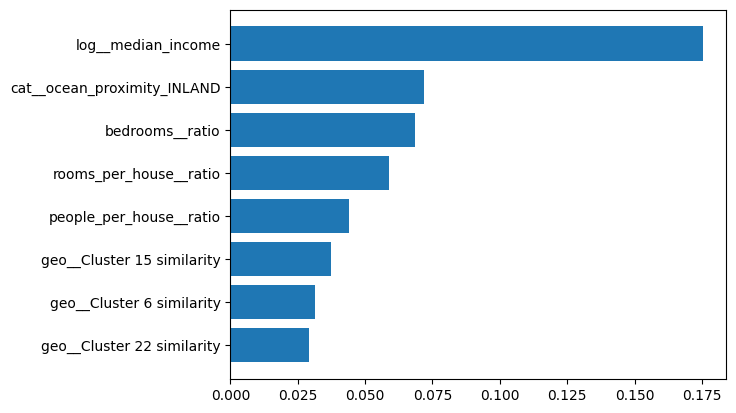

In [52]:
importances, names = zip(*sorted_features)
plt.barh(names[:8][::-1], importances[:8][::-1])

**Model Performance On Test Set**

In [53]:
# Test Set Performance
X_test = strat_test_set.drop("median_house_value", axis=1)
y_test = strat_test_set["median_house_value"].copy()
final_predictions = final_model.predict(X_test)
final_rmse = root_mean_squared_error(y_test, final_predictions)
final_rmse

40221.353828030566

In [54]:
confidence = 0.95
squared_errors = (final_predictions - y_test) ** 2
np.sqrt(stats.t.interval(confidence, len(squared_errors) - 1,
                         loc=squared_errors.mean(),
                         scale=stats.sem(squared_errors)))

array([38373.39982895, 41988.05536205])

# 7. Conclusion

**🧾 Model Performance Summary**
**Final RMSE**: ~$40,221

Top Feature:

1. median_income


**🚀 Takeaway**

This Random Forest model performs better and generalizes good due to:

1. Stratified sampling

2. Rich feature engineering (ratios, clusters, logs)

3. Hyperparameter tuning

| Metric                      | Value          |
|----------------------------|----------------|
| Cross-Validated RMSE       | ~$47,328       |
| Tuned Model RMSE (Test)    | **$40,221**    |
| 95% Confidence Interval     | $38,373 – $41,988 |